In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import torch
import matplotlib.pyplot as plt
from torch import nn
from torch.optim import _functional as F
import plotly.graph_objects as go
import itertools
import ObjectiveFunction as of

In [178]:
class Model(nn.Module):
    """Custom Pytorch model for gradient optimization.
    """

    def __init__(self):
        
        super().__init__()
        # initialize weights with random numbers
        torch.manual_seed(69)
        weights = torch.distributions.Uniform(0, 0.1).sample((3,))
        # make weights torch parameters
        self.weights = nn.Parameter(weights)        
        
    def forward(self, X):
        """Implement function to be optimised. In this case, an exponential decay
        function (a + exp(-k * X) + b),
        """
        a, k, b = self.weights
        return a * torch.exp(-k * X) + b
    
def training_loop(model, optimizer, n=1000):
    "Training loop for torch model."
    losses = []
    for i in range(n):
        preds = model(x)
        loss = F.mse_loss(preds, y).sqrt()
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        losses.append(float(loss))
    return losses

In [22]:
n = 1000
noise = torch.Tensor(np.random.normal(0, 0.02, size=n))
x = torch.arange(n)
a, k, b = 0.7, .01, 0.2
y = a * np.exp(-k * x) + b + noise

In [74]:
# instantiate model
m = Model()
# Instantiate optimizer
opt = torch.optim.Adam(m.parameters(), lr=0.001)
losses = training_loop(m, opt)

In [250]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=np.arange(len(losses)), y=losses))
fig.update_layout(
    autosize=False,
    width=800,
    height=800)
fig.show()

In [249]:
m = Model()
opt = torch.optim.Adam(m.parameters(), lr=0.005)
losses = []
params = []
list(m.parameters())[0].data.detach().numpy()
for i in range(1000):
    preds = m(x)
    loss = F.mse_loss(preds, y).sqrt()
    loss.backward()
    opt.step()
    opt.zero_grad()
    losses.append(float(loss))
    params.append(list(m.parameters())[0].data.detach().clone().numpy())

In [280]:
class GaussianWellModel(nn.Module):

    def __init__(self):
        
        super().__init__()
        torch.manual_seed(69)
        weights = torch.Tensor([0,0])
        self.weights = nn.Parameter(weights)
        self.centers = [torch.Tensor([-6,4]), torch.Tensor([5,-2]), torch.Tensor([-4,-4])]
        self.depths = [torch.Tensor([-0.05]), torch.Tensor([-0.06]), torch.Tensor([-0.04])]
        self.sigmas = [torch.Tensor([2]), torch.Tensor([3]), torch.Tensor([5.5])]
        
    def forward(self, X=None):
        """
        Implement function to be optimised.
        """

        if X is None:
            X = self.weights

        z = 0
        for c, d, s in zip(self.centers, self.depths, self.sigmas):
            v = X - c
            z += d/(2*np.pi*s**2) * torch.exp(-torch.dot(v,v.T)/(2*s**2))

        return z

In [317]:
m = GaussianWellModel()
opt = torch.optim.Adam(m.parameters(), lr=5)
losses, params, preds = [], [], []
params.append(list(m.parameters())[0].data.detach().clone().numpy())

for i in range(1000):
    pred = m()
    loss = pred
    loss.backward()
    opt.step()
    opt.zero_grad()
    losses.append(float(loss))
    params.append(list(m.parameters())[0].data.detach().clone().numpy())
    preds.append(float(pred))
params = [list(_) for _ in list(zip(*params))]

In [318]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=np.arange(len(losses)), y=losses))
fig.update_layout(
    autosize=False,
    width=800,
    height=800)
fig.show()

In [315]:
X = np.arange(-25, 26, 0.1)
Y = np.arange(-25, 26, 0.1)
grid = [np.array(_) for _ in itertools.product(X,Y)]
Z = [float(m.forward(torch.Tensor(_))) for _ in grid]
Z = np.array(Z).reshape(len(X), len(Y)).T

In [319]:
fig = go.Figure()
fig.add_trace(go.Surface(x=X, y=Y, z=Z))
fig.add_trace(go.Scatter3d(x=params[0], y=params[1], z=preds))
fig.update_layout(
    autosize=False,
    width=800,
    height=800)
fig.show()

In [311]:
"""
TODO:
    - look at pytorch source code and work out how to implement custom optimiser algorithm
    - look into levy noise theory
    - look into levy python package for sampling from levy distributions - apparently non-analytic? (aly)
    - finish reading the ADAM and AdaDelta papers + og review paper
DO BY END OF WEEKEND 13/03/2022
"""

'\nTODO:\n    - look at pytorch source code and work out how to implement custom optimiser algorithm\n    - look into levy noise theory\n    - look into levy python package for sampling from levy distributions - apparently non-analytiic? (aly)\n'

In [40]:
%load_ext autoreload
%autoreload 2
!jupyter nbextension enable --py widgetsnbextension
import torch
from torch import nn
import itertools
import ObjectiveFunction as of
from SGDLevy import SGDLevy
from scipy.stats import levy_stable
import matplotlib.pyplot as plt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [26]:
#m = of.AlpineN1(start=[2.5,2.5,2.5,2.5,2.5,2.5])
m = of.AlpineN1(start=[2.5,2.5])
alpline_sgdlevy = of.OptimisationProblem(
    m,
    #torch.optim.NAdam(m.parameters()),
    SGDLevy(m.parameters(), lr=0.1, momentum=0.9, noise_pc=0.00008, alpha=1.9),
    n_epochs = 1000
)

alpline_sgdlevy.run()
fig1, fig2 = alpline_sgdlevy.visualise((-5, 6), (-6, 6), 0.1, render="contour")
#fig1 = alpline_sgdlevy.visualise((-25, 26), (-25, 26), 0.1, render=False)
fig1.show()

In [27]:
fig2.show()

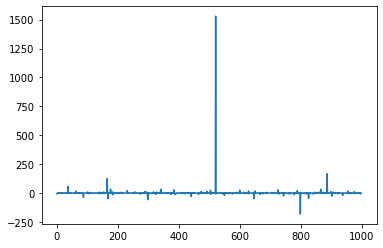

In [4]:
r = levy_stable.rvs(alpha=1.1, beta=0, size=1000)
plt.plot(r)

In [7]:
for _ in x.data:
    r = levy_stable.rvs(alpha=1.1, beta=0, size=1000)

1.0
2.0


In [ ]:

"""
Local order parameter e.g. entropy
adaptive levy noise (the diffusion exponent)
exp weighted squared displacements to characterise sub-diffusion vs super-diffusion

relate noise to sub/super --> work out how to change sub/super based on tail index or equivalent
work out local order parameter and use it to adapt the noise based on local landscape (SGD walker feels the landscape)

p --> alpha --> noise

want to find non-noisy minima cos this is likely to generalise well
"""


In [44]:
endings = []
for _ in range(0, 1000):

    m = of.AlpineN1(start=[2.5,2.5])
    alpline_sgdlevy = of.OptimisationProblem(
        m,
        SGDLevy(m.parameters(), lr=0.1, momentum=0.9, noise_pc=0.00008, alpha=1.9),
        n_epochs = 1000
    )

    losses, params, preds = alpline_sgdlevy.run()
    endings.append(preds[-1])

plt.hist(endings)

Exception ignored in: <function tqdm.__del__ at 0x0000017E0CF160D0>
Traceback (most recent call last):
  File "C:\Users\karls\Anaconda3\envs\honours\lib\site-packages\tqdm\std.py", line 1162, in __del__
    self.close()
  File "C:\Users\karls\Anaconda3\envs\honours\lib\site-packages\tqdm\notebook.py", line 286, in close
    self.disp(bar_style='danger', check_delay=False)
AttributeError: 'tqdm_notebook' object has no attribute 'disp'
Exception ignored in: <function tqdm.__del__ at 0x0000017E0CF160D0>
Traceback (most recent call last):
  File "C:\Users\karls\Anaconda3\envs\honours\lib\site-packages\tqdm\std.py", line 1162, in __del__
    self.close()
  File "C:\Users\karls\Anaconda3\envs\honours\lib\site-packages\tqdm\notebook.py", line 286, in close
    self.disp(bar_style='danger', check_delay=False)
AttributeError: 'tqdm_notebook' object has no attribute 'disp'


KeyboardInterrupt: 